# Image Edition with Flux.1 Kontext Pro with Azure AI Foundry

**FLUX.1 Kontext Pro** is a cutting-edge **image generation and editing model** available through Azure AI Foundry.

<img src="https://flux2ai.com/wp-content/uploads/2025/08/FLUX-Models-Launch-on-Azure-AI-Foundry.png" width=512>

## FLUX.1 Kontext Pro
- In-context image generation and editing (text + image prompt).
- Local edits, style transfers, background replacement, typography integration.
- Maintains character consistency.
- Single model unifies local edits, full scene re-gen, style transfer, character consistency, iterative editing.
- Up to 8× faster than other SOTA editors.
- 1024 x 1024 default: iterative multi-turn editing.
- #1 ranking on KontextBench for text-guided editing and consistency

## Links
- Documentation: https://techcommunity.microsoft.com/blog/azure-ai-foundry-blog/black-forest-labs-flux-1-kontext-pro-and-flux1-1-pro-now-available-in-azure-ai-f/4434659?previewMessage=true
- Benchmarks: https://ai.azure.com/catalog/models/FLUX.1-Kontext-pro
- Blog: https://flux2ai.com/flux-models-now-available-on-azure-ai-foundry/

In [1]:
import base64
import gradio as gr
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os
import requests
import shutil
import sys
import time

from datetime import datetime
from dotenv import load_dotenv
from pathlib import Path
from PIL import Image
from typing import Optional, Dict, Any
from urllib.parse import urlparse

## 1. Settings

In [2]:
load_dotenv("azure.env")

endpoint = os.getenv("endpoint")
api_key = os.getenv("key")

parsed_url = urlparse(endpoint)
base_url = f"{parsed_url.scheme}://{parsed_url.netloc}"

In [3]:
base_url[-22:]

'.services.ai.azure.com'

In [4]:
sys.version

'3.10.18 (main, Jun  5 2025, 13:14:17) [GCC 11.2.0]'

In [5]:
print(f"Today is: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Today is: 2025-09-09 07:35:19


In [6]:
IMAGES_DIR = "images"

if os.path.exists(IMAGES_DIR) and os.path.isdir(IMAGES_DIR):
    shutil.rmtree(IMAGES_DIR)  # Del dir

os.makedirs(IMAGES_DIR, exist_ok=True)

In [7]:
IMAGES_EDIT_DIR = "editions"

if os.path.exists(IMAGES_EDIT_DIR) and os.path.isdir(IMAGES_EDIT_DIR):
    shutil.rmtree(IMAGES_EDIT_DIR)  # Del dir

os.makedirs(IMAGES_EDIT_DIR, exist_ok=True)

## 2. Helper


In [8]:
class FluxImageAPI:
    """
    A Python wrapper for FLUX.1-Kontext-pro image generation and editing API
    """
    def __init__(self, api_key: str, base_url: str = base_url):
        """
        Initialize the FLUX API client

        Args:
            api_key: Your Azure API key
            base_url: The base URL for the Azure AI Foundry service
        """
        self.api_key = api_key
        self.base_url = base_url
        self.headers = {
            "Content-Type": "application/json",
            "Authorization": f"Bearer {api_key}"
        }

    def generate_image(self,
                       prompt: str,
                       size: str = "1024x1024",
                       n: int = 1,
                       output_path: Optional[str] = None) -> Dict[str, Any]:
        """
        Generate an image using FLUX.1-Kontext-pro

        Args:
            prompt: Description of the image to generate
            size: Image dimensions (e.g., "1024x1024", "512x512")
            n: Number of images to generate
            output_path: Path to save the generated image

        Returns:
            Dictionary containing the API response and local file path
        """
        url = f"{self.base_url}/openai/deployments/FLUX.1-Kontext-pro/images/generations"

        payload = {
            "prompt": prompt,
            "size": size,  # 1024x1792 or 1024x1014
            "n": n,
            "model": "flux.1-kontext-pro",
            "output_format": "png",
        }

        params = {"api-version": "2025-04-01-preview"}

        try:
            print(f"🧠 Generating image with prompt: {prompt}...")
            response = requests.post(url,
                                     headers=self.headers,
                                     json=payload,
                                     params=params)
            response.raise_for_status()

            result = response.json()

            # Decode and save the image
            if result.get("data") and len(result["data"]) > 0:
                b64_image = result["data"][0]["b64_json"]
                image_data = base64.b64decode(b64_image)

                # Set default output path if not provided
                if output_path is None:
                    output_path = os.path.join(
                        IMAGES_DIR,
                        f"generated_image_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
                    )

                # Save the image
                with open(output_path, "wb") as f:
                    f.write(image_data)

                print(f"🖼️ Image saved to: {output_path}")

                return {
                    "success": True,
                    "file_path": output_path,
                    "api_response": result,
                    "image_size": len(image_data)
                }
            else:
                return {"success": False, "error": "No image data received"}

        except requests.exceptions.RequestException as e:
            return {"success": False, "error": f"Request failed: {str(e)}"}
        except Exception as e:
            return {"success": False, "error": f"Unexpected error: {str(e)}"}

    def edit_image(self,
                   image_path: str,
                   prompt: str,
                   output_path: Optional[str] = None) -> Dict[str, Any]:
        """
        Edit an existing image using FLUX.1-Kontext-pro

        Args:
            image_path: Path to the image file to edit
            prompt: Description of the edits to make
            output_path: Path to save the edited image

        Returns:
            Dictionary containing the API response and local file path
        """
        url = f"{self.base_url}/openai/deployments/FLUX.1-Kontext-pro/images/edits"

        # Check if input image exists
        if not Path(image_path).exists():
            return {
                "success": False,
                "error": f"Image file not found: {image_path}"
            }

        # Prepare multipart form data
        files = {
            "model": (None, "flux.1-kontext-pro"),
            "image": (Path(image_path).name, open(image_path,
                                                  "rb"), "image/png"),
            "prompt": (None, prompt)
        }

        # Remove Content-Type header for multipart requests
        headers = {"Authorization": f"Bearer {self.api_key}"}
        params = {"api-version": "2025-04-01-preview"}

        try:
            print(
                f"✏️ Editing image '{image_path}' with prompt: '{prompt}'...")
            response = requests.post(url,
                                     headers=headers,
                                     files=files,
                                     params=params)

            # Close the file
            files["image"][1].close()

            response.raise_for_status()

            result = response.json()

            # Decode and save the edited image
            if result.get("data") and len(result["data"]) > 0:
                b64_image = result["data"][0]["b64_json"]
                image_data = base64.b64decode(b64_image)

                # Set default output path if not provided
                if output_path is None:
                    base_name = Path(image_path).stem
                    output_path = os.path.join(
                        IMAGES_EDIT_DIR,
                        f"{base_name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
                    )

                # Save the edited image
                with open(output_path, "wb") as f:
                    f.write(image_data)

                print(f"🖼️ Edited image saved to: {output_path}")

                return {
                    "success": True,
                    "file_path": output_path,
                    "api_response": result,
                    "image_size": len(image_data)
                }
            else:
                return {"success": False, "error": "No image data received"}

        except requests.exceptions.RequestException as e:
            return {"success": False, "error": f"Request failed: {str(e)}"}
        except Exception as e:
            return {"success": False, "error": f"Unexpected error: {str(e)}"}

In [9]:
def display_images(directory_path : str,
                   images_per_row:int = 3,
                   figsize: tuple = (15, 10),
                    startname: str | None = None,
                   sort_by="ctime"):
    """
    Display all image files from a directory in a grid layout.

    Args:
        directory_path (str | Path): Path to the directory containing images.
        images_per_row (int): Number of images to display per row (default: 3).
        figsize (tuple): Figure size for the plot (default: (15, 10)).
        sort_by (str): Attribute to sort images by: "ctime", "mtime", "name" (default: "ctime").
    """
    # Convert to Path object for easier handling
    directory = Path(directory_path)

    if not directory.exists() or not directory.is_dir():
        raise ValueError(f"Invalid directory path: {directory}")

    # Supported image extensions
    image_extensions = {
        ".jpg", ".jpeg", ".png", ".bmp", ".gif", ".tiff", ".webp"
    }

    # Collect image files
    image_files = [
        f for f in directory.iterdir() if f.suffix.lower() in image_extensions
        and f.name.lower().startswith(startname)
    ]

    if not image_files:
        print(f"No image files found in {directory}")
        return

    # Sorting
    if sort_by == "ctime":
        image_files.sort(key=lambda f: f.stat().st_ctime)
    elif sort_by == "mtime":
        image_files.sort(key=lambda f: f.stat().st_mtime)
    elif sort_by == "name":
        image_files.sort(key=lambda f: f.name.lower())

    # Calculate grid dimensions
    num_images = len(image_files)
    num_rows = (num_images + images_per_row -
                1) // images_per_row  # Ceiling division

    # Create subplots
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=figsize)
    fig.suptitle(f"Images from {directory} ({num_images} images)", fontsize=16)

    # Normalize axes to 2D array
    axes = np.atleast_2d(axes)

    # Display images
    for i, img_file in enumerate(image_files):
        row, col = divmod(i, images_per_row)
        ax = axes[row, col]

        try:
            img = mpimg.imread(img_file)
            ax.imshow(img)
            ax.set_title(img_file.name, fontsize=9)
        except Exception as e:
            ax.text(0.5,
                    0.5,
                    f"Error loading\n{img_file.name}",
                    ha="center",
                    va="center",
                    fontsize=8,
                    transform=ax.transAxes)
        ax.axis("off")

    # Hide any unused subplots
    for j in range(num_images, num_rows * images_per_row):
        row, col = divmod(j, images_per_row)
        axes[row, col].axis("off")

    plt.tight_layout()
    plt.show()

In [10]:
flux_api = FluxImageAPI(api_key)

## 3. Image generation examples

In [11]:
prompt = """
Close-up of a woman eye, direct frontal view. 
Detailed blue iris and pupil.
Sharp focus on eye texture and color. 
Natural lighting to capture authentic eye shine and depth. 
The words "Azure Flux 1 Kontext Pro" are painted over it in big, white brush strokes with visible texture.
Add on the low bottom right the term 'Powered by Azure Foundry'. This term should be in black.
"""

Image Generation Example

🧠 Generating image with prompt: 
Close-up of a woman eye, direct frontal view. 
Detailed blue iris and pupil.
Sharp focus on eye texture and color. 
Natural lighting to capture authentic eye shine and depth. 
The words "Azure Flux 1 Kontext Pro" are painted over it in big, white brush strokes with visible texture.
Add on the low bottom right the term 'Powered by Azure Foundry'. This term should be in black.
...
🖼️ Image saved to: images/generated_image_20250909_073530.png
✅ Generation successful!
📁 File: images/generated_image_20250909_073530.png
📊 Size: 1429896 bytes



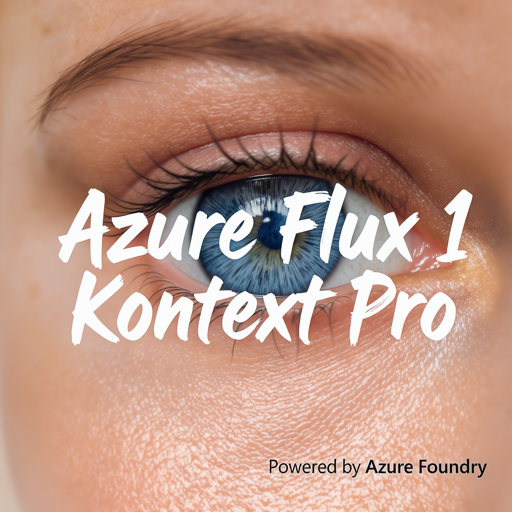

In [12]:
print("Image Generation Example\n")

generation_result = flux_api.generate_image(
    prompt=prompt,
    size="1024x1024",
)

if generation_result["success"]:
    print(f"✅ Generation successful!")
    print(f"📁 File: {generation_result['file_path']}")
    print(f"📊 Size: {generation_result['image_size']} bytes\n")
    display(Image.open(generation_result['file_path']).resize((512, 512)))
else:
    print(f"❌ Generation failed: {generation_result['error']}")

## 4. Image edition

We can use the previous image or we can use any existing image

In [13]:
def image_edition(
    prompt: str,
    initial_image: str | Any
) -> str | None:
    """
    Edit an image using a text prompt and return the path to the edited file.

    Args:
        prompt (str): Instruction describing how to edit the image.
        initial_image (str | Any): Path to the source image, or an image object.

    Returns:
        str | None: Path to the edited image if successful, otherwise None.
    """
    print("🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry\n")

    start = time.time()

    edit_result = flux_api.edit_image(
        image_path=initial_image,
        prompt=prompt,
    )

    if edit_result["success"]:
        print("✅ Edit successful!")
        print(f"📊 Size: {edit_result['image_size']} bytes")
        elapsed = time.time() - start
        print(f"🕒 Done in {elapsed:.3f} seconds\n")

        # Display resized preview
        display(Image.open(edit_result['file_path']).resize((360, 360)))

        return edit_result['file_path']
    else:
        print(f"❌ Edit failed: {edit_result['error']}")
        return None


### Example 1

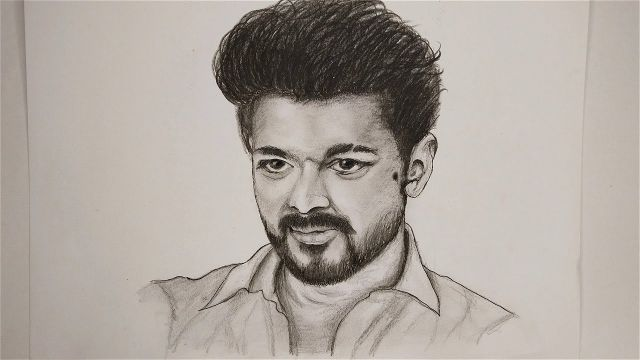

In [14]:
my_image = "input_images/sketch.jpg"

img = Image.open(my_image)
img

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/sketch.jpg' with prompt: 'Make this image real'...
🖼️ Edited image saved to: editions/sketch_20250909_073546.png
✅ Edit successful!
📊 Size: 1344213 bytes
🕒 Done in 7.654 seconds



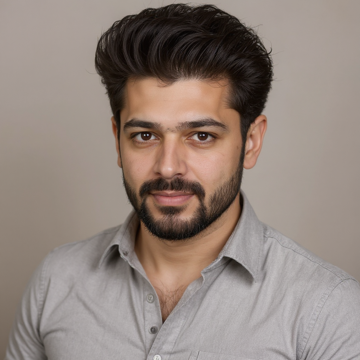

In [15]:
prompt = "Make this image real"

genimg = image_edition(prompt, my_image)

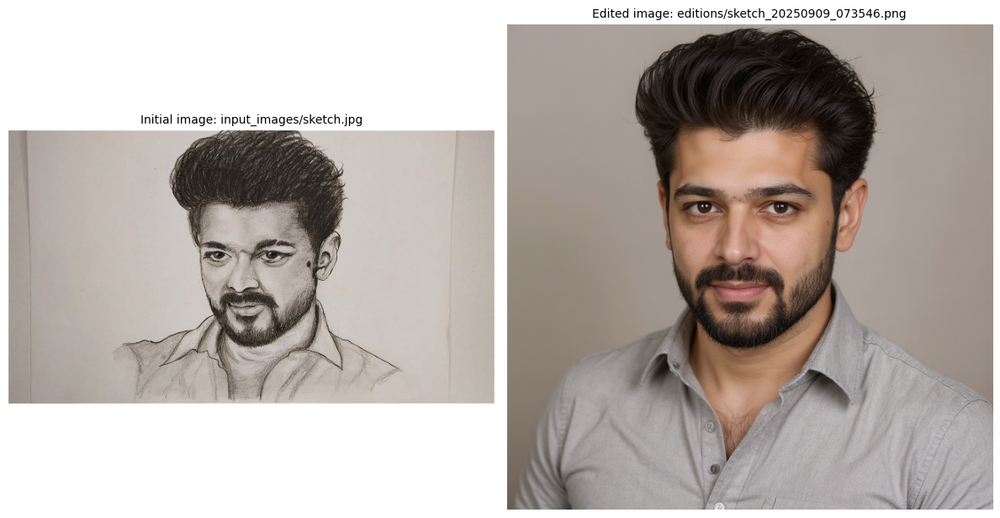

In [16]:
img1 = Image.open(my_image)
img2 = Image.open(genimg)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title(f'Initial image: {my_image}', size=10)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title(f'Edited image: {genimg}', size=10)
plt.axis('off')

plt.tight_layout()
plt.show()

### Example 2

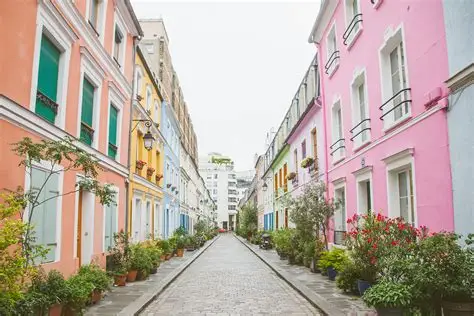

In [17]:
my_image = "input_images/paris.webp"

img = Image.open(my_image)
img

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/paris.webp' with prompt: 'Add a labrador dog on the street with a black cat'...
🖼️ Edited image saved to: editions/paris_20250909_073615.png
✅ Edit successful!
📊 Size: 1404388 bytes
🕒 Done in 23.819 seconds



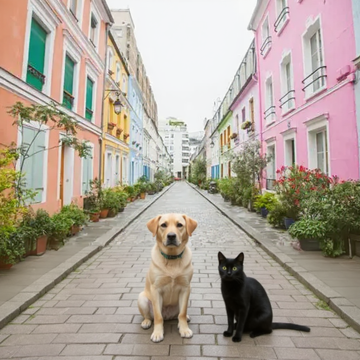

In [18]:
prompt = "Add a labrador dog on the street with a black cat"

genimg = image_edition(prompt, my_image)

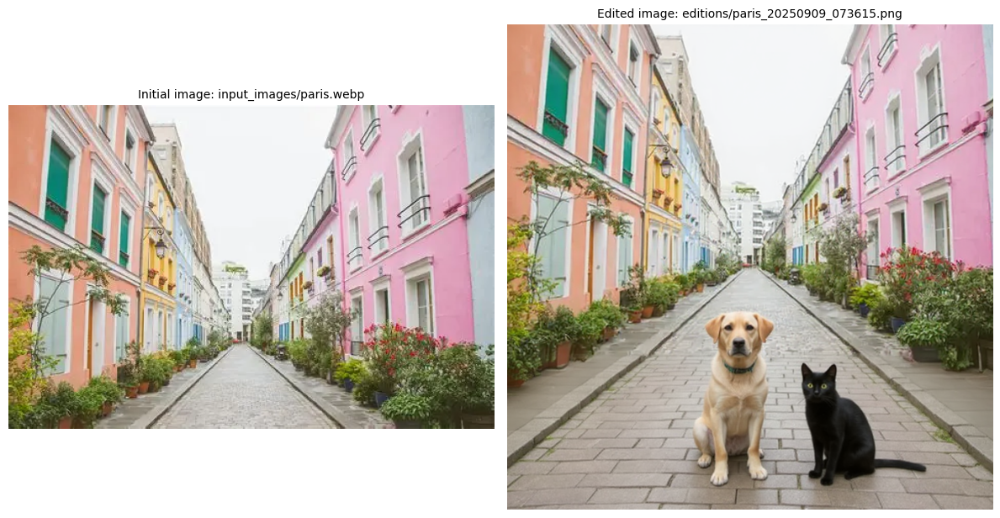

In [19]:
img1 = Image.open(my_image)
img2 = Image.open(genimg)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title(f'Initial image: {my_image}', size=10)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title(f'Edited image: {genimg}', size=10)
plt.axis('off')

plt.tight_layout()
plt.show()

### Example 3

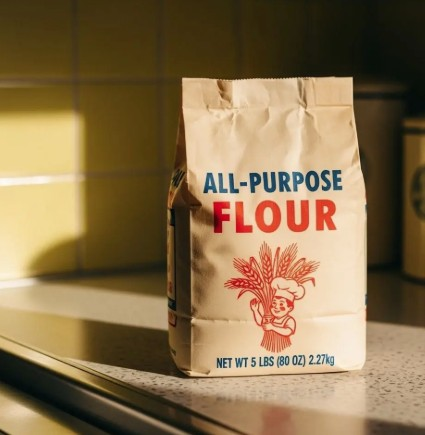

In [20]:
my_image = "input_images/product.jpg"

img = Image.open(my_image)
img

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/product.jpg' with prompt: 'Remove the word 'All-purpose flour''...
🖼️ Edited image saved to: editions/product_20250909_073624.png
✅ Edit successful!
📊 Size: 984268 bytes
🕒 Done in 7.973 seconds



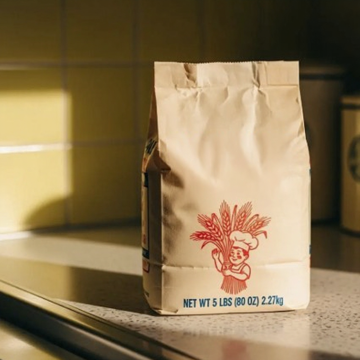

In [21]:
prompt = "Remove the word 'All-purpose flour'"

genimg = image_edition(prompt, my_image)

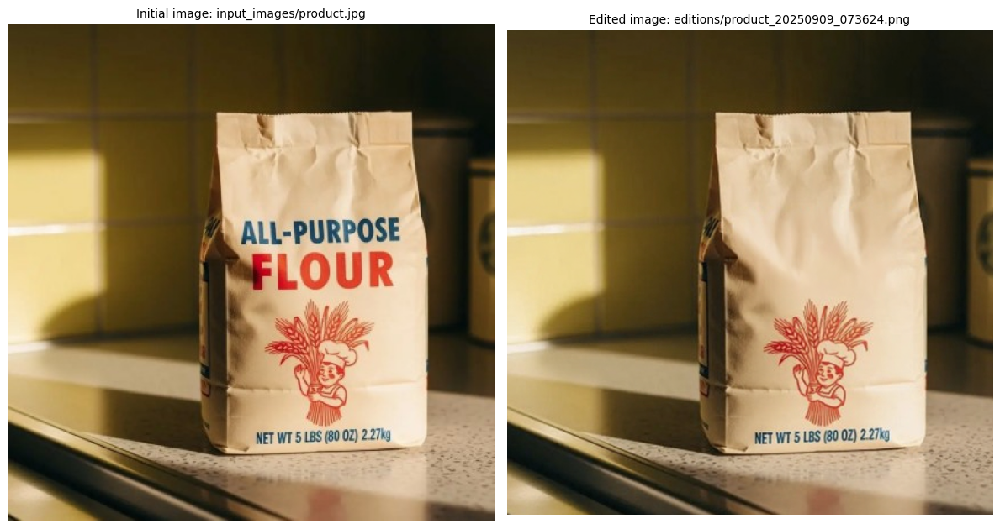

In [22]:
img1 = Image.open(my_image)
img2 = Image.open(genimg)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title(f'Initial image: {my_image}', size=10)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title(f'Edited image: {genimg}', size=10)
plt.axis('off')

plt.tight_layout()
plt.show()

### Example 4

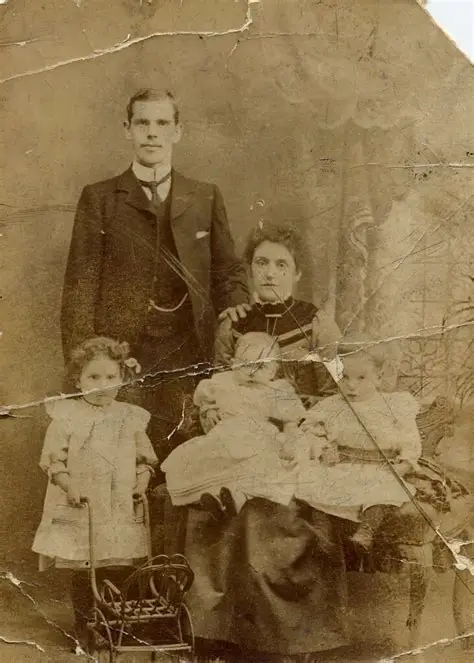

In [23]:
my_image = "input_images/old.webp"

img = Image.open(my_image)
img

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/old.webp' with prompt: 'Restore vintage family photo'...
🖼️ Edited image saved to: editions/old_20250909_073632.png
✅ Edit successful!
📊 Size: 1307777 bytes
🕒 Done in 6.758 seconds



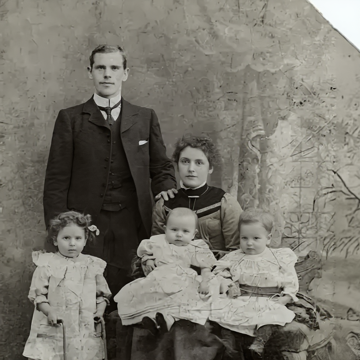

In [24]:
prompt = "Restore vintage family photo"

genimg = image_edition(prompt, my_image)

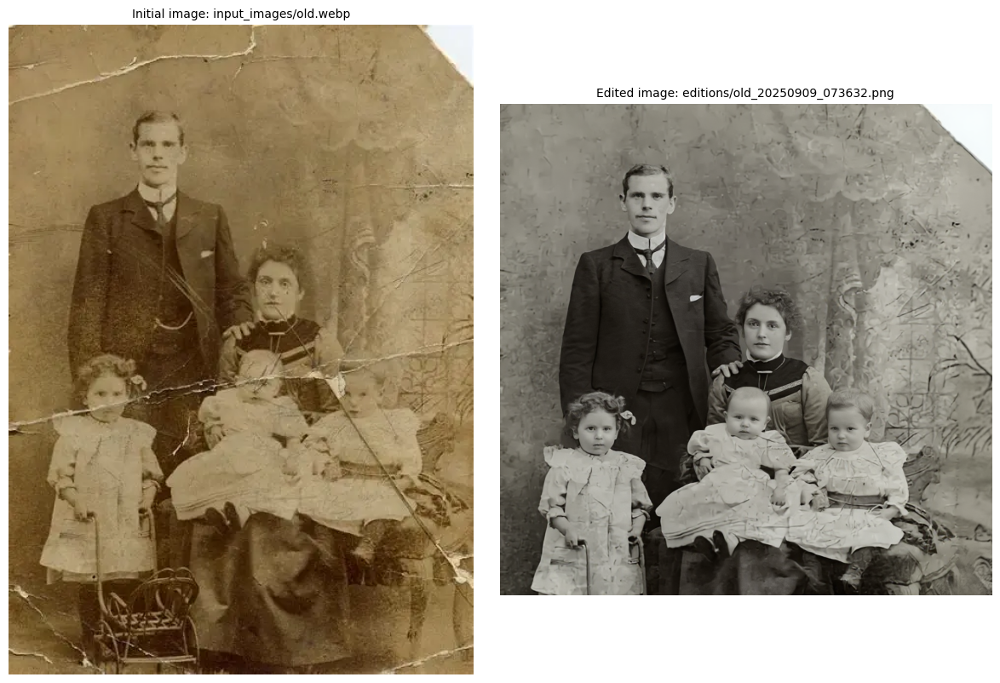

In [25]:
img1 = Image.open(my_image)
img2 = Image.open(genimg)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title(f'Initial image: {my_image}', size=10)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title(f'Edited image: {genimg}', size=10)
plt.axis('off')

plt.tight_layout()
plt.show()

### Examples 5

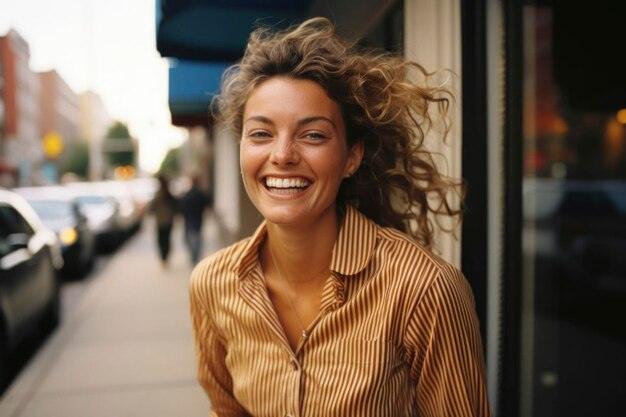

In [26]:
my_image = "input_images/face.jpg"

img = Image.open(my_image)
img

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Create adorable baby version of face'...
🖼️ Edited image saved to: editions/face_20250909_073645.png
✅ Edit successful!
📊 Size: 1138832 bytes
🕒 Done in 6.122 seconds



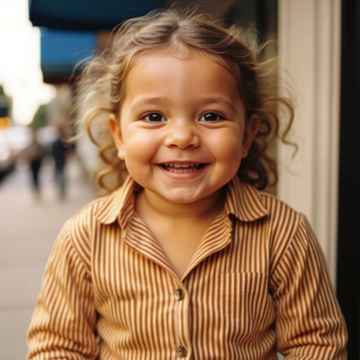

'editions/face_20250909_073645.png'

In [27]:
prompt = "Create adorable baby version of face"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Create professional image'...
🖼️ Edited image saved to: editions/face_20250909_073658.png
✅ Edit successful!
📊 Size: 1071336 bytes
🕒 Done in 6.061 seconds



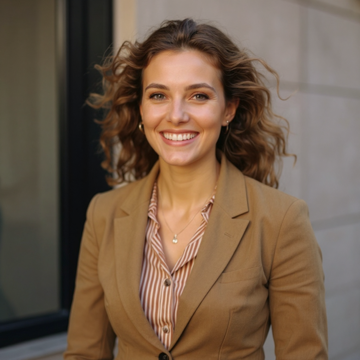

'editions/face_20250909_073658.png'

In [28]:
prompt = "Create professional image"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Change the color of the hair to orange'...
🖼️ Edited image saved to: editions/face_20250909_073710.png
✅ Edit successful!
📊 Size: 1193681 bytes
🕒 Done in 9.503 seconds



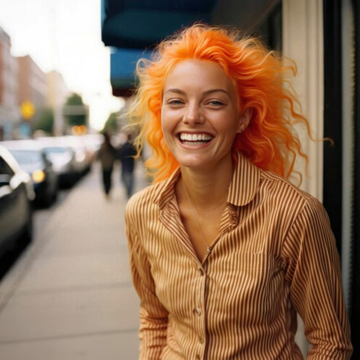

'editions/face_20250909_073710.png'

In [29]:
prompt = "Change the color of the hair to orange"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Add shorted brown hair'...
🖼️ Edited image saved to: editions/face_20250909_073716.png
✅ Edit successful!
📊 Size: 1161212 bytes
🕒 Done in 5.750 seconds



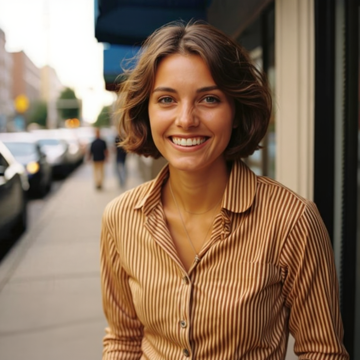

'editions/face_20250909_073716.png'

In [30]:
prompt = "Add shorted brown hair"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Add a white shirt with an orange tie. Add some sunglasses'...
🖼️ Edited image saved to: editions/face_20250909_073722.png
✅ Edit successful!
📊 Size: 1012077 bytes
🕒 Done in 5.858 seconds



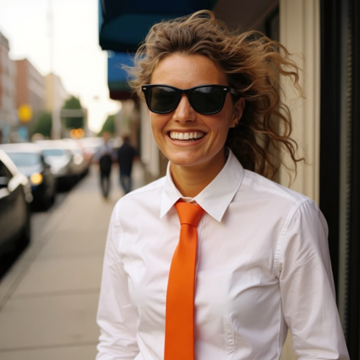

'editions/face_20250909_073722.png'

In [31]:
prompt = "Add a white shirt with an orange tie. Add some sunglasses"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Replace the background with a strong white solid color'...
🖼️ Edited image saved to: editions/face_20250909_073727.png
✅ Edit successful!
📊 Size: 827069 bytes
🕒 Done in 5.166 seconds



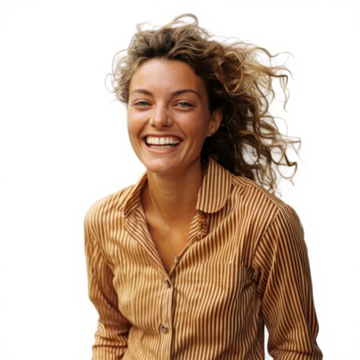

'editions/face_20250909_073727.png'

In [32]:
prompt = "Replace the background with a strong white solid color"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Add long blond hair'...
🖼️ Edited image saved to: editions/face_20250909_073734.png
✅ Edit successful!
📊 Size: 1203128 bytes
🕒 Done in 6.298 seconds



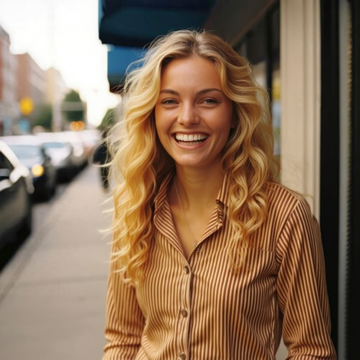

'editions/face_20250909_073734.png'

In [33]:
prompt = "Add long blond hair"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Add a pink t-shirt with the text 'I love Azure' on it'...
🖼️ Edited image saved to: editions/face_20250909_073740.png
✅ Edit successful!
📊 Size: 1151892 bytes
🕒 Done in 6.377 seconds



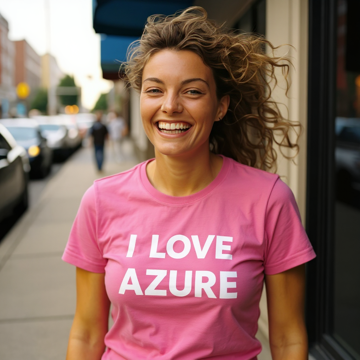

'editions/face_20250909_073740.png'

In [34]:
prompt="Add a pink t-shirt with the text 'I love Azure' on it"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Turn the image into the night'...
🖼️ Edited image saved to: editions/face_20250909_073746.png
✅ Edit successful!
📊 Size: 749216 bytes
🕒 Done in 5.359 seconds



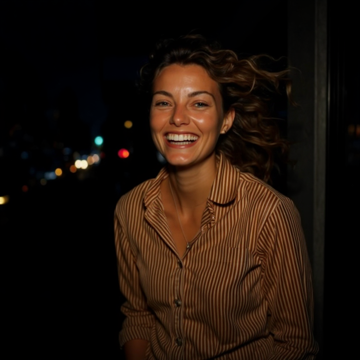

'editions/face_20250909_073746.png'

In [35]:
prompt = "Turn the image into the night"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Replace the clothes with a blue, white and red hoodie like th French flag'...
🖼️ Edited image saved to: editions/face_20250909_073752.png
✅ Edit successful!
📊 Size: 1071599 bytes
🕒 Done in 6.099 seconds



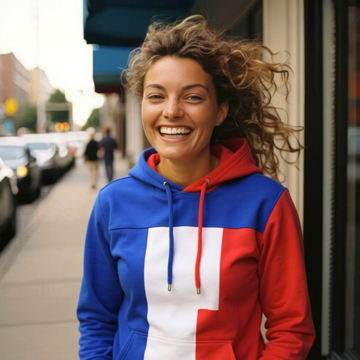

'editions/face_20250909_073752.png'

In [36]:
prompt = "Replace the clothes with a blue, white and red hoodie like th French flag"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Converted to pencil sketch'...
🖼️ Edited image saved to: editions/face_20250909_073802.png
✅ Edit successful!
📊 Size: 2226950 bytes
🕒 Done in 9.925 seconds



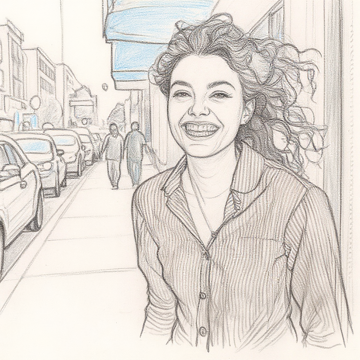

'editions/face_20250909_073802.png'

In [37]:
prompt = "Converted to pencil sketch"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Transformed to oil painting'...
🖼️ Edited image saved to: editions/face_20250909_073815.png
✅ Edit successful!
📊 Size: 1974659 bytes
🕒 Done in 12.768 seconds



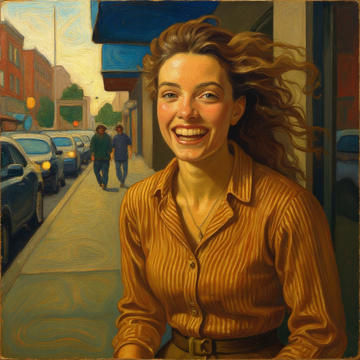

'editions/face_20250909_073815.png'

In [38]:
prompt = "Transformed to oil painting"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Adjust lighting to warm golden hour ambiance - create soft directional light from 45-degree angle, eliminate harsh overhead shadows, add warm honey-colored rim lighting on hair and shoulders, soften facial shadows with subtle fill light, enhance texture details in clothing and skin, create gentle catchlight in eyes, warm up color temperature to 3200K, add atmospheric haze for dreamy mood, preserve original pose and composition'...
🖼️ Edited image saved to: editions/face_20250909_073821.png
✅ Edit successful!
📊 Size: 1241976 bytes
🕒 Done in 5.848 seconds



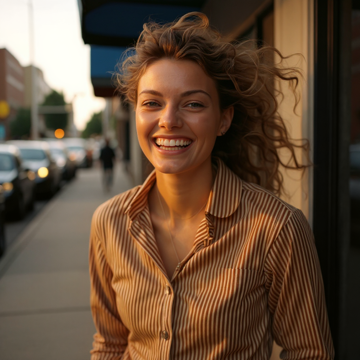

'editions/face_20250909_073821.png'

In [39]:
prompt = "Adjust lighting to warm golden hour ambiance - create soft directional light from 45-degree angle, eliminate harsh overhead shadows, add warm honey-colored rim lighting on hair and shoulders, soften facial shadows with subtle fill light, enhance texture details in clothing and skin, create gentle catchlight in eyes, warm up color temperature to 3200K, add atmospheric haze for dreamy mood, preserve original pose and composition"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Remove the person from the image'...
🖼️ Edited image saved to: editions/face_20250909_073827.png
✅ Edit successful!
📊 Size: 863732 bytes
🕒 Done in 6.395 seconds



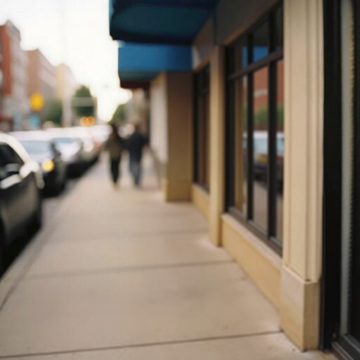

'editions/face_20250909_073827.png'

In [40]:
prompt = "Remove the person from the image"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Add an office background'...
🖼️ Edited image saved to: editions/face_20250909_073834.png
✅ Edit successful!
📊 Size: 1272796 bytes
🕒 Done in 6.626 seconds



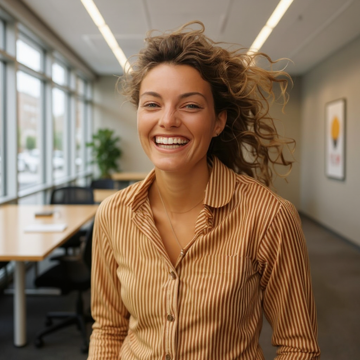

'editions/face_20250909_073834.png'

In [41]:
prompt = "Add an office background"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Make this person driving a car'...
🖼️ Edited image saved to: editions/face_20250909_073840.png
✅ Edit successful!
📊 Size: 1213369 bytes
🕒 Done in 6.162 seconds



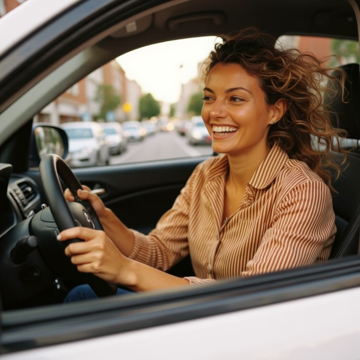

'editions/face_20250909_073840.png'

In [42]:
prompt = "Make this person driving a car"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'View the person from the back'...
🖼️ Edited image saved to: editions/face_20250909_073850.png
✅ Edit successful!
📊 Size: 1255488 bytes
🕒 Done in 9.872 seconds



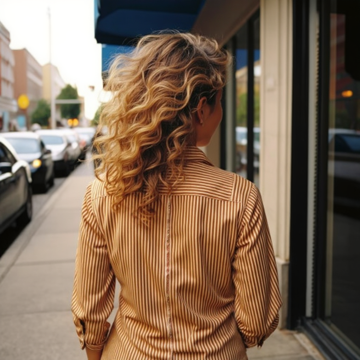

'editions/face_20250909_073850.png'

In [43]:
prompt = "View the person from the back"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Put a Covid-19 mask'...
🖼️ Edited image saved to: editions/face_20250909_073857.png
✅ Edit successful!
📊 Size: 1203285 bytes
🕒 Done in 6.864 seconds



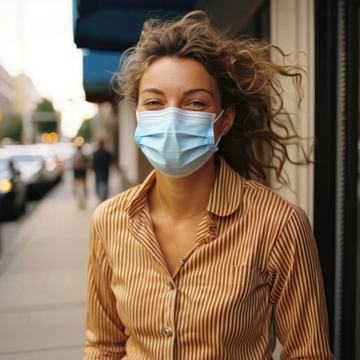

'editions/face_20250909_073857.png'

In [44]:
prompt = "Put a Covid-19 mask"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Bird's-eye perspective'...
🖼️ Edited image saved to: editions/face_20250909_073913.png
✅ Edit successful!
📊 Size: 1231344 bytes
🕒 Done in 16.084 seconds



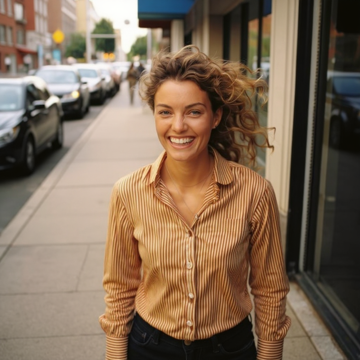

'editions/face_20250909_073913.png'

In [45]:
prompt = "Bird's-eye perspective"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Use a pixelart style'...
🖼️ Edited image saved to: editions/face_20250909_073920.png
✅ Edit successful!
📊 Size: 1980555 bytes
🕒 Done in 6.532 seconds



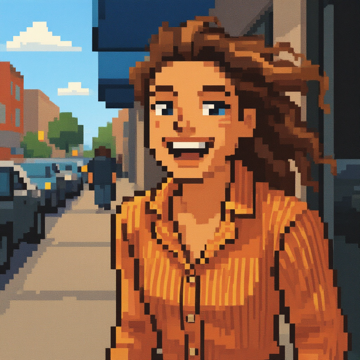

'editions/face_20250909_073920.png'

In [46]:
prompt = "Use a pixelart style"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Generate a magazine cover 'VOGUE Fashion mag 2025''...
🖼️ Edited image saved to: editions/face_20250909_074011.png
✅ Edit successful!
📊 Size: 1204614 bytes
🕒 Done in 6.158 seconds



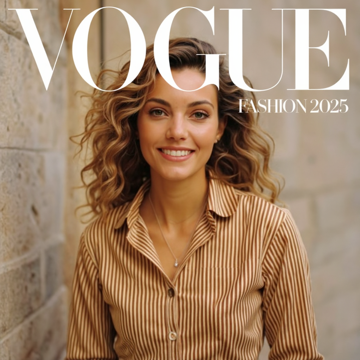

'editions/face_20250909_074011.png'

In [51]:
prompt = "Generate a magazine cover 'VOGUE Fashion mag 2025'"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Studio Ghibli'...
🖼️ Edited image saved to: editions/face_20250909_073932.png
✅ Edit successful!
📊 Size: 1712870 bytes
🕒 Done in 6.078 seconds



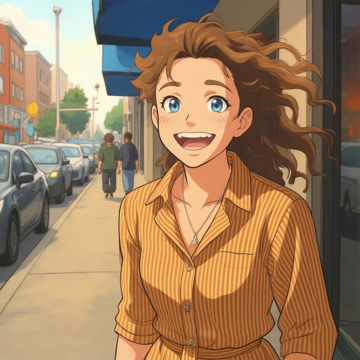

'editions/face_20250909_073932.png'

In [48]:
prompt = "Studio Ghibli"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Transform the image into black and white'...
🖼️ Edited image saved to: editions/face_20250909_073939.png
✅ Edit successful!
📊 Size: 1160873 bytes
🕒 Done in 7.612 seconds



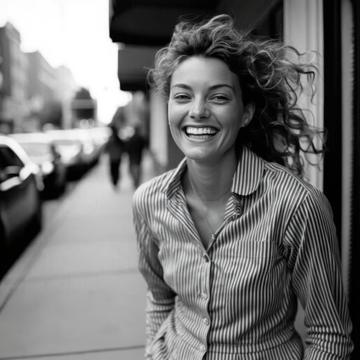

'editions/face_20250909_073939.png'

In [49]:
prompt = "Transform the image into black and white"

image_edition(prompt, my_image)

🧑‍🎨 Image editing example using Flux.1 Kontext Pro with Azure AI Foundry

✏️ Editing image 'input_images/face.jpg' with prompt: 'Transform into a muppet's show character'...
🖼️ Edited image saved to: editions/face_20250909_074230.png
✅ Edit successful!
📊 Size: 1269094 bytes
🕒 Done in 7.120 seconds



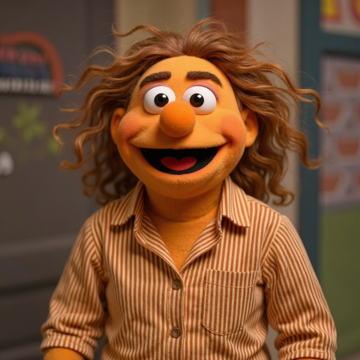

'editions/face_20250909_074230.png'

In [58]:
prompt = "Transform into a muppet's show character"

image_edition(prompt, my_image)

### All images

#### Initial image

Initial image: input_images/face.jpg


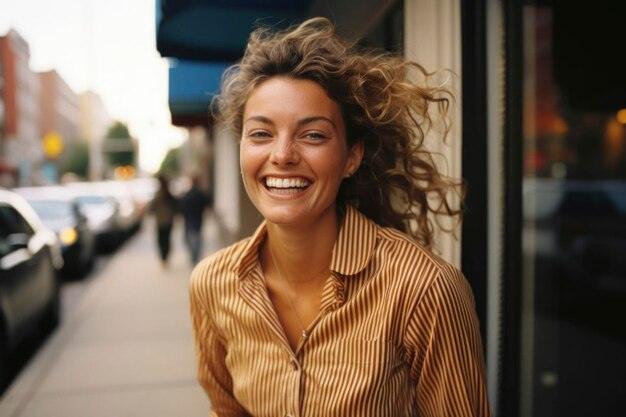

In [52]:
img = Image.open(my_image)
print(f"Initial image: {my_image}")
img

#### Images variations

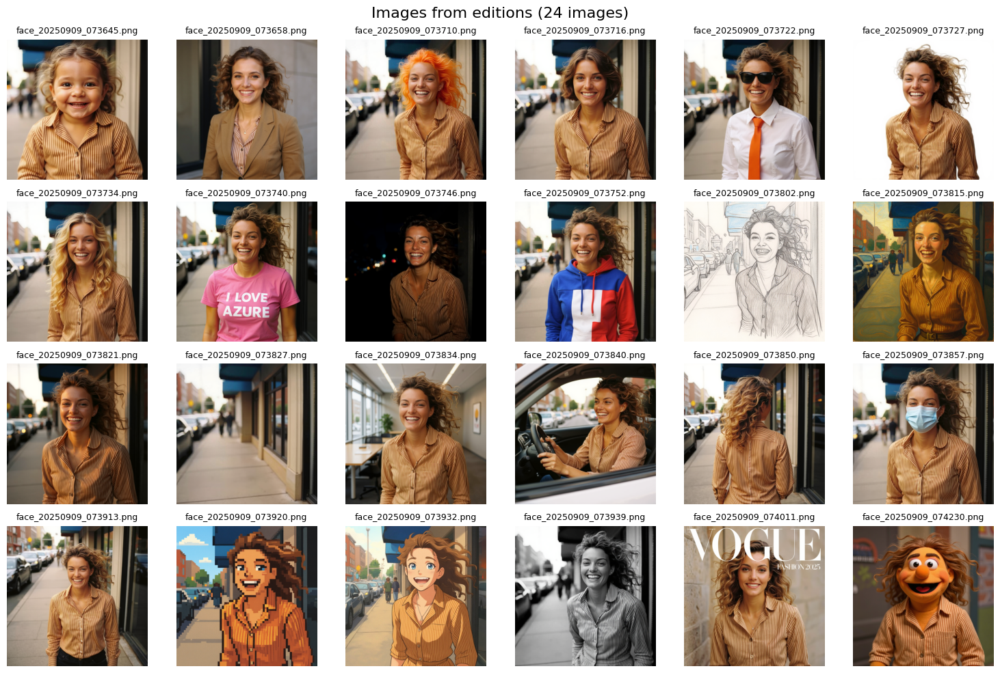

In [59]:
display_images(IMAGES_EDIT_DIR, images_per_row=6, startname='face', figsize=(15, 10))

## 5. Gradio webapp

In [55]:
def gradio_fn(prompt, initial_image):
    """Main gradio function for the Gradio interface"""
    start = time.time()

    edit_result = flux_api.edit_image(
        image_path=initial_image,
        prompt=prompt,
    )

    if edit_result["success"]:
        elapsed = time.time() - start
        size_mb = edit_result['image_size'] / (1024 * 1024)
        status = f"✅ OK. File created: {edit_result['file_path']}\n🔢 File size: {size_mb:.2f} MB\n🕒 Done in {elapsed:.3f} seconds"
        return edit_result['file_path'], status
    else:
        print(f"❌ Edit failed: {edit_result['error']}")
        return None

In [56]:
def create_gradio_interface():
    """Create and configure the Gradio interface"""
    # Create the Gradio interface
    with gr.Blocks(title="AI IMAGE EDITOR",
                   theme="gstaff/sketch") as interface:

        # Header
        gr.HTML("""
        <div style="text-align: center; padding: 20px; margin-bottom: 20px;">
            <h1>🎨 AI IMAGE EDITOR</h1>
            <h3>Transform your images with Flux.1 Kontext Pro & Azure AI Foundry</h3>
        </div>
        """)

        with gr.Row():
            with gr.Column(scale=1):
                # Image input
                input_image = gr.Image(label="⬆️ Upload your image",
                                       type="filepath",
                                       height=600,
                                       interactive=True)

                # Prompt input
                prompt_input = gr.Textbox(
                    label="📝 Prompt to edit the image",
                    placeholder=
                    "Describe what you want to change in the image (e.g., 'make the sky sunset colors', 'add a cat in the foreground', 'change to winter scene')",
                    lines=3,
                    max_lines=6)

            with gr.Column(scale=1):
                output_image = gr.Image(
                    label="🎨 Generated image",
                    height=600,
                    interactive=False,
                    render=True,
                    show_download_button=True,
                )

                # Status
                with gr.Row():
                    status_output = gr.Textbox(label="ℹ️ Status",
                                               lines=3,
                                               interactive=False)

        gr.Markdown("### 💡 Prompt examples")
        example_prompts = [
            "Make it look like a sunset scene",
            "Add a white shirt with an orange tie. Add some sunglasses",
            "Add long blond hair",
            "Replace the clothes with a blue, white and red hoodie like the French flag",
            "Convert to pencil sketch",
            "Remove the person from the image",
            "Add a beach background",
            "Make this person driving a car",
            "This person is in a restaurant",
            "View the person from the back",
            "Bird's-eye perspective",
            "Add some ray ban sunglasses",
            "Apply ghibli style",
            "This person is in a office wearing some business clothes",
            "This person is in a restaurant eating a pizza wearing some ray ban and wearing a pink lacoste polo",
        ]

        for i in range(0, len(example_prompts), 4):
            with gr.Row():
                for j in range(4):
                    if i + j < len(example_prompts):
                        example = example_prompts[i + j]
                        gr.Button(example,
                                  size="sm",
                                  variant="secondary",
                                  scale=1).click(lambda x=example: x,
                                                 outputs=prompt_input)
                    else:
                        # Add empty space for incomplete rows
                        gr.HTML("")

        # Centered RUN button with minimum width
        with gr.Row():
            with gr.Column(scale=1):
                pass
            with gr.Column(scale=2):
                submit_btn = gr.Button("RUN", variant="primary", size="lg")
            with gr.Column(scale=1):
                pass

        def process_edit(prompt, image):
            """ Process edit image """
            if not prompt or not prompt.strip():
                return None, "❌ Please enter a prompt describing your desired edits"

            if not image:
                return None, "❌ Please upload an image first"

            return gradio_fn(prompt, image)

        submit_btn.click(fn=process_edit,
                         inputs=[prompt_input, input_image],
                         outputs=[output_image, status_output])

    return interface

In [57]:
webapp = create_gradio_interface()

webapp.launch(share=True)

* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://64817008e3cc139ffe.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


✏️ Editing image '/tmp/gradio/97c9972d2778118861bc539a67be64c453209059e8f8864363321854e5384463/product.jpg' with prompt: 'Convert to pencil sketch'...
🖼️ Edited image saved to: editions/product_20250909_074202.png
